In [2]:
import os 

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"
#os.environ["CUDA_LAUNCH_BLOCKING"] = 1

import random
import numpy as np
import matplotlib.pyplot as plt

import json
import cv2
from tqdm import tqdm
from PIL import Image

PATH = "/home/faisal/7.1.e_optha_EX"
train_image_dir = os.path.join(PATH, "training/images")
train_ann_dir = os.path.join(PATH, "training/ground_truth/Hard Exudates")
val_image_dir = os.path.join(PATH, "validation/images")
val_ann_dir = os.path.join(PATH, "validation/ground_truth/Hard Exudates")
test_image_dir = os.path.join(PATH, "test/images")
test_ann_dir = os.path.join(PATH, "test/ground_truth/Hard Exudates")
train_image_names = sorted(os.listdir(train_image_dir))
train_ann_names = sorted(os.listdir(train_ann_dir))
val_image_names = sorted(os.listdir(val_image_dir))
val_ann_names = sorted(os.listdir(val_ann_dir))
test_image_names = sorted(os.listdir(test_image_dir))
test_ann_names = sorted(os.listdir(test_ann_dir))



import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms.functional as TF 
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

class SEGDataset(Dataset):
    def __init__(self, image_dir, ann_dir, image_names_list, ann_names_list, transform = None):
        super(SEGDataset, self).__init__()
        self.image_dir = image_dir
        self.ann_dir = ann_dir
        self.images = image_names_list
        self.anns = ann_names_list
        self.transform = transform
    def __len__(self):
        return len(self.images)
    def __getitem__(self, index):
        image_path = os.path.join(self.image_dir, self.images[index])
        ann_path = os.path.join(self.ann_dir, self.anns[index])
        
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        mask = cv2.imread(ann_path, cv2.IMREAD_GRAYSCALE)
        #mask = Image.open(ann_path)
        #mask = np.array(mask)
        mask[mask > 1] = 1
        mask[mask < 1] = 0
        '''ann_file = open(ann_path)
        ann_data = json.load(ann_file)
        #tile_example(img_path, mask_rle, ex_id, organ, 
        mask = np.zeros(shape = image.shape[:-1])
        for idx in range(len(ann_data)):
            ann = [np.array(ann_data[idx], dtype = np.int32)]
            cv2.fillPoly(mask, pts = ann, color = (255, 255, 255))'''
        
        # mask[mask >= 128.0] = 1
        # mask[mask < 128.0] = 0
        
        if self.transform is not None:
            transformer = self.transform(image = image, mask = mask)
            image, mask = transformer["image"], transformer["mask"]
            
        return image, mask
    
#Splitting into train and val sets
random.seed(53)
np.random.seed(53)
torch.manual_seed(53)
'''np.random.shuffle(image_names)
N = len(image_names)
train_len = int(0.9 * N)
val_len = N - train_len'''
#train_image_names = image_names[:train_len]
#val_image_names = image_names[train_len:]
#print(f"No. of training images = {train_len}")
#print(f"No. of validation images = {val_len}")

def get_dataloaders(img_size = 256, batch_size = 16, image_dir = None, ann_dir = None, train_image_dir = None, val_ann_dir = None, test_ann_dir = None,
                    train_image_names = None, train_ann_names = None, val_image_names = None, val_ann_names = None, test_image_names = None, test_ann_names = None):
    
    
    train_transforms = A.Compose([
        A.PadIfNeeded(min_height=2544, min_width=2544, p=1),
        A.CenterCrop(p=1, height=2048, width=2048),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.HorizontalFlip(p = 0.5),
        A.VerticalFlip(p = 0.5),
        A.Rotate(limit = 90, p = 0.5),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    val_transforms = A.Compose([
        A.PadIfNeeded(min_height=2544, min_width=2544, border_mode=cv2.BORDER_CONSTANT, p=1),
        A.CenterCrop(p=1, height=2048, width=2048),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    test_transforms = A.Compose([
        A.PadIfNeeded(min_height=2544, min_width=2544, border_mode=cv2.BORDER_CONSTANT, p=1),
        A.CenterCrop(p=1, height=2048, width=2048),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    

    train_dataset = SEGDataset(image_dir, ann_dir, train_image_names, train_ann_names, train_transforms)
    val_dataset = SEGDataset(val_image_dir, val_ann_dir, val_image_names, val_ann_names, val_transforms)
    test_dataset = SEGDataset(test_image_dir, test_ann_dir, test_image_names, test_ann_names, test_transforms)

    g_seed = torch.Generator()
    g_seed.manual_seed(0)

    train_loader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, pin_memory = True, num_workers = 8)
    val_loader = DataLoader(val_dataset, batch_size = batch_size, shuffle = False, pin_memory = True, num_workers = 8)
    test_loader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, pin_memory = True, num_workers = 8)
    
    return train_loader, val_loader, test_loader

# ESPNetv2

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from torchvision import transforms,datasets
import torch.optim as optim
from torch.autograd import Variable
from torch.optim.lr_scheduler import ReduceLROnPlateau
#from focal_loss.focal_loss import FocalLoss
import torchvision
import sys
#from torchsummary import summary
from ptflops import get_model_complexity_info
from torchinfo import summary
from torchstat import stat
from torch.nn import init

import math
import matplotlib.pyplot as plt
import time
from torchvision import models

import torch
import torch.nn as nn
import torch.nn.functional as F


class PSPModule(nn.Module):
    def __init__(self, features, out_features=1024, sizes=(1, 2, 4, 8)):
        super().__init__()
        self.stages = []
        self.stages = nn.ModuleList([C(features, features, 3, 1, groups=features) for size in sizes])
        self.project = CBR(features * (len(sizes) + 1), out_features, 1, 1)
 
    def forward(self, feats):
        h, w = feats.size(2), feats.size(3)
        out = [feats]
        for stage in self.stages:
            feats = F.avg_pool2d(feats, kernel_size=3, stride=2, padding=1)
            upsampled = F.interpolate(input=stage(feats), size=(h, w), mode='bilinear', align_corners=True)
            out.append(upsampled)
        return self.project(torch.cat(out, dim=1))

class CBR(nn.Module):
    '''
    This class defines the convolution layer with batch normalization and PReLU activation
    '''

    def __init__(self, nIn, nOut, kSize, stride=1, groups=1):
        '''
        :param nIn: number of input channels
        :param nOut: number of output channels
        :param kSize: kernel size
        :param stride: stride rate for down-sampling. Default is 1
        '''
        super().__init__()
        padding = int((kSize - 1) / 2)
        self.conv = nn.Conv2d(nIn, nOut, kSize, stride=stride, padding=padding, bias=False, groups=groups)
        self.bn = nn.BatchNorm2d(nOut)
        self.act = nn.PReLU(nOut)

    def forward(self, input):
        '''
        :param input: input feature map
        :return: transformed feature map
        '''
        output = self.conv(input)
        # output = self.conv1(output)
        output = self.bn(output)
        output = self.act(output)
        return output


class BR(nn.Module):
    '''
        This class groups the batch normalization and PReLU activation
    '''

    def __init__(self, nOut):
        '''
        :param nOut: output feature maps
        '''
        super().__init__()
        self.bn = nn.BatchNorm2d(nOut)
        self.act = nn.PReLU(nOut)

    def forward(self, input):
        '''
        :param input: input feature map
        :return: normalized and thresholded feature map
        '''
        output = self.bn(input)
        output = self.act(output)
        return output


class CB(nn.Module):
    '''
       This class groups the convolution and batch normalization
    '''

    def __init__(self, nIn, nOut, kSize, stride=1, groups=1):
        '''
        :param nIn: number of input channels
        :param nOut: number of output channels
        :param kSize: kernel size
        :param stride: optinal stide for down-sampling
        '''
        super().__init__()
        padding = int((kSize - 1) / 2)
        self.conv = nn.Conv2d(nIn, nOut, kSize, stride=stride, padding=padding, bias=False,
                              groups=groups)
        self.bn = nn.BatchNorm2d(nOut)

    def forward(self, input):
        '''
        :param input: input feature map
        :return: transformed feature map
        '''
        output = self.conv(input)
        output = self.bn(output)
        return output


class C(nn.Module):
    '''
    This class is for a convolutional layer.
    '''

    def __init__(self, nIn, nOut, kSize, stride=1, groups=1):
        '''
        :param nIn: number of input channels
        :param nOut: number of output channels
        :param kSize: kernel size
        :param stride: optional stride rate for down-sampling
        '''
        super().__init__()
        padding = int((kSize - 1) / 2)
        self.conv = nn.Conv2d(nIn, nOut, kSize, stride=stride, padding=padding, bias=False,
                              groups=groups)

    def forward(self, input):
        '''
        :param input: input feature map
        :return: transformed feature map
        '''
        output = self.conv(input)
        return output


class CDilated(nn.Module):
    '''
    This class defines the dilated convolution.
    '''

    def __init__(self, nIn, nOut, kSize, stride=1, d=1, groups=1):
        '''
        :param nIn: number of input channels
        :param nOut: number of output channels
        :param kSize: kernel size
        :param stride: optional stride rate for down-sampling
        :param d: optional dilation rate
        '''
        super().__init__()
        padding = int((kSize - 1) / 2) * d
        self.conv = nn.Conv2d(nIn, nOut,kSize, stride=stride, padding=padding, bias=False,
                              dilation=d, groups=groups)

    def forward(self, input):
        '''
        :param input: input feature map
        :return: transformed feature map
        '''
        output = self.conv(input)
        return output

class CDilatedB(nn.Module):
    '''
    This class defines the dilated convolution with batch normalization.
    '''

    def __init__(self, nIn, nOut, kSize, stride=1, d=1, groups=1):
        '''
        :param nIn: number of input channels
        :param nOut: number of output channels
        :param kSize: kernel size
        :param stride: optional stride rate for down-sampling
        :param d: optional dilation rate
        '''
        super().__init__()
        padding = int((kSize - 1) / 2) * d
        self.conv = nn.Conv2d(nIn, nOut,kSize, stride=stride, padding=padding, bias=False,
                              dilation=d, groups=groups)
        self.bn = nn.BatchNorm2d(nOut)

    def forward(self, input):
        '''
        :param input: input feature map
        :return: transformed feature map
        '''
        return self.bn(self.conv(input))

class EESP(nn.Module):
    '''
    This class defines the EESP block, which is based on the following principle
        REDUCE ---> SPLIT ---> TRANSFORM --> MERGE
    '''

    def __init__(self, nIn, nOut, stride=1, k=4, r_lim=7, down_method='esp'): #down_method --> ['avg' or 'esp']
        '''
        :param nIn: number of input channels
        :param nOut: number of output channels
        :param stride: factor by which we should skip (useful for down-sampling). If 2, then down-samples the feature map by 2
        :param k: # of parallel branches
        :param r_lim: A maximum value of receptive field allowed for EESP block
        :param g: number of groups to be used in the feature map reduction step.
        '''
        super().__init__()
        self.stride = stride
        n = int(nOut / k)
        n1 = nOut - (k - 1) * n
        assert down_method in ['avg', 'esp'], 'One of these is suppported (avg or esp)'
        assert n == n1, "n(={}) and n1(={}) should be equal for Depth-wise Convolution ".format(n, n1)
        #assert nIn%k == 0, "Number of input channels ({}) should be divisible by # of branches ({})".format(nIn, k)
        #assert n % k == 0, "Number of output channels ({}) should be divisible by # of branches ({})".format(n, k)
        self.proj_1x1 = CBR(nIn, n, 1, stride=1, groups=k)

        # (For convenience) Mapping between dilation rate and receptive field for a 3x3 kernel
        map_receptive_ksize = {3: 1, 5: 2, 7: 3, 9: 4, 11: 5, 13: 6, 15: 7, 17: 8}
        self.k_sizes = list()
        for i in range(k):
            ksize = int(3 + 2 * i)
            # After reaching the receptive field limit, fall back to the base kernel size of 3 with a dilation rate of 1
            ksize = ksize if ksize <= r_lim else 3
            self.k_sizes.append(ksize)
        # sort (in ascending order) these kernel sizes based on their receptive field
        # This enables us to ignore the kernels (3x3 in our case) with the same effective receptive field in hierarchical
        # feature fusion because kernels with 3x3 receptive fields does not have gridding artifact.
        self.k_sizes.sort()
        self.spp_dw = nn.ModuleList()
        #self.bn = nn.ModuleList()
        for i in range(k):
            d_rate = map_receptive_ksize[self.k_sizes[i]]
            self.spp_dw.append(CDilated(n, n, kSize=3, stride=stride, groups=n, d=d_rate))
            #self.bn.append(nn.BatchNorm2d(n))
        self.conv_1x1_exp = CB(nOut, nOut, 1, 1, groups=k)
        self.br_after_cat = BR(nOut)
        self.module_act = nn.PReLU(nOut)
        self.downAvg = True if down_method == 'avg' else False

    def forward(self, input):
        '''
        :param input: input feature map
        :return: transformed feature map
        '''

        # Reduce --> project high-dimensional feature maps to low-dimensional space
        output1 = self.proj_1x1(input)
        output = [self.spp_dw[0](output1)]
        # compute the output for each branch and hierarchically fuse them
        # i.e. Split --> Transform --> HFF
        for k in range(1, len(self.spp_dw)):
            out_k = self.spp_dw[k](output1)
            # HFF
            # We donot combine the branches that have the same effective receptive (3x3 in our case)
            # because there are no holes in those kernels.
            out_k = out_k + output[k - 1]
            #apply batch norm after fusion and then append to the list
            output.append(out_k)
        # Merge
        expanded = self.conv_1x1_exp( # Aggregate the feature maps using point-wise convolution
            self.br_after_cat( # apply batch normalization followed by activation function (PRelu in this case)
                torch.cat(output, 1) # concatenate the output of different branches
            )
        )
        del output
        # if down-sampling, then return the concatenated vector
        # as Downsampling function will combine it with avg. pooled feature map and then threshold it
        if self.stride == 2 and self.downAvg:
            return expanded

        # if dimensions of input and concatenated vector are the same, add them (RESIDUAL LINK)
        if expanded.size() == input.size():
            expanded = expanded + input

        # Threshold the feature map using activation function (PReLU in this case)
        return self.module_act(expanded)


class DownSampler(nn.Module):
    '''
    Down-sampling fucntion that has two parallel branches: (1) avg pooling
    and (2) EESP block with stride of 2. The output feature maps of these branches
    are then concatenated and thresholded using an activation function (PReLU in our
    case) to produce the final output.
    '''

    def __init__(self, nin, nout, k=4, r_lim=9, reinf=True):
        '''
            :param nin: number of input channels
            :param nout: number of output channels
            :param k: # of parallel branches
            :param r_lim: A maximum value of receptive field allowed for EESP block
            :param g: number of groups to be used in the feature map reduction step.
        '''
        super().__init__()
        nout_new = nout - nin
        self.eesp = EESP(nin, nout_new, stride=2, k=k, r_lim=r_lim, down_method='avg')
        self.avg = nn.AvgPool2d(kernel_size=3, padding=1, stride=2)
        if reinf:
            self.inp_reinf = nn.Sequential(
                CBR(config_inp_reinf, config_inp_reinf, 3, 1),
                CB(config_inp_reinf, nout, 1, 1)
            )
        self.act =  nn.PReLU(nout)

    def forward(self, input, input2=None):
        '''
        :param input: input feature map
        :return: feature map down-sampled by a factor of 2
        '''
        avg_out = self.avg(input)
        eesp_out = self.eesp(input)
        output = torch.cat([avg_out, eesp_out], 1)
        if input2 is not None:
            #assuming the input is a square image
            w1 = avg_out.size(2)
            while True:
                input2 = F.avg_pool2d(input2, kernel_size=3, padding=1, stride=2)
                w2 = input2.size(2)
                if w2 == w1:
                    break
            output = output + self.inp_reinf(input2)

        return self.act(output) #self.act(output)

class EESPNet(nn.Module):
    '''
    This class defines the ESPNetv2 architecture for the ImageNet classification
    '''

    def __init__(self, classes=20, s=1):
        '''
        :param classes: number of classes in the dataset. Default is 20 for the cityscapes
        :param s: factor that scales the number of output feature maps
        '''
        super().__init__()
        reps = [0, 3, 7, 3]  # how many times EESP blocks should be repeated.
        channels = 3

        r_lim = [13, 11, 9, 7, 5]  # receptive field at each spatial level
        K = [4]*len(r_lim) # No. of parallel branches at different levels

        base = 32 #base configuration
        config_len = 5
        config = [base] * config_len
        base_s = 0
        for i in range(config_len):
            if i== 0:
                base_s = int(base * s)
                base_s = math.ceil(base_s / K[0]) * K[0]
                config[i] = base if base_s > base else base_s
            else:
                config[i] = base_s * pow(2, i)
        if s <= 1.5:
            config.append(1024)
        elif s in [1.5, 2]:
            config.append(1280)
        else:
            ValueError('Configuration not supported')

        #print('Config: ', config)

        global config_inp_reinf
        config_inp_reinf = 3
        self.input_reinforcement = True
        assert len(K) == len(r_lim), 'Length of branching factor array and receptive field array should be the same.'

        self.level1 = CBR(channels, config[0], 3, 2)  # 112 L1

        self.level2_0 = DownSampler(config[0], config[1], k=K[0], r_lim=r_lim[0], reinf=self.input_reinforcement)  # out = 56
        self.level3_0 = DownSampler(config[1], config[2], k=K[1], r_lim=r_lim[1], reinf=self.input_reinforcement) # out = 28
        self.level3 = nn.ModuleList()
        for i in range(reps[1]):
            self.level3.append(EESP(config[2], config[2], stride=1, k=K[2], r_lim=r_lim[2]))

        self.level4_0 = DownSampler(config[2], config[3], k=K[2], r_lim=r_lim[2], reinf=self.input_reinforcement) #out = 14
        self.level4 = nn.ModuleList()
        for i in range(reps[2]):
            self.level4.append(EESP(config[3], config[3], stride=1, k=K[3], r_lim=r_lim[3]))

        self.level5_0 = DownSampler(config[3], config[4], k=K[3], r_lim=r_lim[3]) #7
        self.level5 = nn.ModuleList()
        for i in range(reps[3]):
            self.level5.append(EESP(config[4], config[4], stride=1, k=K[4], r_lim=r_lim[4]))

        # expand the feature maps using depth-wise separable convolution
        self.level5.append(CBR(config[4], config[4], 3, 1, groups=config[4]))
        self.level5.append(CBR(config[4], config[5], 1, 1, groups=K[4]))



        #self.level5_exp = nn.ModuleList()
        #assert config[5]%config[4] == 0, '{} should be divisible by {}'.format(config[5], config[4])
        #gr = int(config[5]/config[4])
        #for i in range(gr):
        #    self.level5_exp.append(CBR(config[4], config[4], 1, 1, groups=pow(2, i)))

        self.classifier = nn.Linear(config[5], classes)
        self.init_params()

    def init_params(self):
        '''
        Function to initialze the parameters
        '''
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, std=0.001)
                if m.bias is not None:
                    init.constant_(m.bias, 0)

    def forward(self, input, p=0.2, seg=True):
        '''
        :param input: Receives the input RGB image
        :return: a C-dimensional vector, C=# of classes
        '''
        out_l1 = self.level1(input)  # 112
        if not self.input_reinforcement:
            del input
            input = None

        out_l2 = self.level2_0(out_l1, input)  # 56

        out_l3_0 = self.level3_0(out_l2, input)  # out_l2_inp_rein
        for i, layer in enumerate(self.level3):
            if i == 0:
                out_l3 = layer(out_l3_0)
            else:
                out_l3 = layer(out_l3)

        out_l4_0 = self.level4_0(out_l3, input)  # down-sampled
        for i, layer in enumerate(self.level4):
            if i == 0:
                out_l4 = layer(out_l4_0)
            else:
                out_l4 = layer(out_l4)

        if not seg:
            out_l5_0 = self.level5_0(out_l4)  # down-sampled
            for i, layer in enumerate(self.level5):
                if i == 0:
                    out_l5 = layer(out_l5_0)
                else:
                    out_l5 = layer(out_l5)

            #out_e = []
            #for layer in self.level5_exp:
            #    out_e.append(layer(out_l5))
            #out_exp = torch.cat(out_e, dim=1)



            output_g = F.adaptive_avg_pool2d(out_l5, output_size=1)
            output_g = F.dropout(output_g, p=p, training=self.training)
            output_1x1 = output_g.view(output_g.size(0), -1)

            return self.classifier(output_1x1)
        return out_l1, out_l2, out_l3, out_l4

class ESPNetv2(nn.Module):
    def __init__(self, classes=20, s=1, pretrained=None, gpus=1):
        super().__init__()
        classificationNet = EESPNet(classes=classes, s=s)
        if gpus >=1:
            classificationNet = nn.DataParallel(classificationNet)
        # load the pretrained weights
        if pretrained:
            if not os.path.isfile(pretrained):
                print('Weight file does not exist. Training without pre-trained weights')
            print('Model initialized with pretrained weights')
            classificationNet.load_state_dict(torch.load(pretrained))

        self.net = classificationNet.module

        del classificationNet
        # delete last few layers
        del self.net.classifier
        del self.net.level5
        del self.net.level5_0
        if s <=0.5:
            p = 0.1
        else:
            p=0.2

        self.proj_L4_C = CBR(self.net.level4[-1].module_act.num_parameters, self.net.level3[-1].module_act.num_parameters, 1, 1)
        pspSize = 2*self.net.level3[-1].module_act.num_parameters
        self.pspMod = nn.Sequential(EESP(pspSize, pspSize //2, stride=1, k=4, r_lim=7),
                PSPModule(pspSize // 2, pspSize //2))
        self.project_l3 = nn.Sequential(nn.Dropout2d(p=p), C(pspSize // 2, classes, 1, 1))
        self.act_l3 = BR(classes)
        self.project_l2 = CBR(self.net.level2_0.act.num_parameters + classes, classes, 1, 1)
        self.project_l1 = nn.Sequential(nn.Dropout2d(p=p), C(self.net.level1.act.num_parameters + classes, classes, 1, 1))

    def hierarchicalUpsample(self, x, factor=3):
        for i in range(factor):
            x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=True)
        return x


    def forward(self, input):
        out_l1, out_l2, out_l3, out_l4 = self.net(input, seg=True)
        out_l4_proj = self.proj_L4_C(out_l4)
        up_l4_to_l3 = F.interpolate(out_l4_proj, scale_factor=2, mode='bilinear', align_corners=True)
        merged_l3_upl4 = self.pspMod(torch.cat([out_l3, up_l4_to_l3], 1))
        proj_merge_l3_bef_act = self.project_l3(merged_l3_upl4)
        proj_merge_l3 = self.act_l3(proj_merge_l3_bef_act)
        out_up_l3 = F.interpolate(proj_merge_l3, scale_factor=2, mode='bilinear', align_corners=True)
        merge_l2 = self.project_l2(torch.cat([out_l2, out_up_l3], 1))
        out_up_l2 = F.interpolate(merge_l2, scale_factor=2, mode='bilinear', align_corners=True)
        merge_l1 = self.project_l1(torch.cat([out_l1, out_up_l2], 1))
        if self.training:
            return F.interpolate(merge_l1, scale_factor=2, mode='bilinear', align_corners=True), self.hierarchicalUpsample(proj_merge_l3_bef_act)
        else:
            return F.interpolate(merge_l1, scale_factor=2, mode='bilinear', align_corners=True)

In [4]:
def validate(model, loader, epoch, device = 'cpu'):
    model.eval()
    loss_ep = 0
    dice_coeff_ep = 0.0
    jaccard_indx = 0
    f1_ep = 0
    with torch.no_grad():
        for idx, (images, masks) in enumerate(loader):
            images = images.to(device)
            masks = masks.to(device).long()
            
            outputs = model(images)
            #outputs = F.sigmoid(model(images))
            #criterion = FocalLoss(gamma= 2, alpha = alpha)
            loss = criterion(outputs, masks)
            #loss = criterion(outputs, masks.unsqueeze(1).float())
            _, pred = outputs.max(1)
            #num_correct += (pred == masks).sum()
            #num_samples += pred.size(0)
            #dice_coeff_ep += dice_coeff_binary(pred.detach(), masks.to(device).unsqueeze(1))
            dice_coeff_ep += dice(pred.detach(), masks.to(device).unsqueeze(1), average = 'micro', num_classes = 2)
            jaccard_indx += ji(pred.detach(), masks.to(device), 'multiclass', num_classes = 2)
            f1_ep += f1_score(pred.detach(), masks.to(device), 'multiclass', average = 'macro', multidim_average= 'global', num_classes = 2)
            loss_ep += loss.item()
    val_loss = loss_ep/len(loader)
    dice_coeff = dice_coeff_ep/len(loader)
    jac_indx = jaccard_indx/len(loader)
    f1 = f1_ep/len(loader)
    return val_loss, dice_coeff, jac_indx , f1

In [5]:
from torchmetrics.functional import jaccard_index as ji
from torchmetrics.functional import dice
from torchmetrics.functional import f1_score

#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = 'cpu'
img_size = 1024
batch_size = 8

train_loader, val_loader, test_loader = get_dataloaders(img_size, batch_size, train_image_dir, train_ann_dir, val_image_dir, val_ann_dir, test_ann_dir, train_image_names, train_ann_names, val_image_names, val_ann_names, test_image_names, test_ann_names)

#model = MeDiAUNET(in_channels = 3, out_channels = 2 ,features = [64, 128, 256, 512])
#model = MeDiAUNET(in_channels = 3, out_channels = 2)
#model = SUMNet_all_bn(in_ch=3,out_ch=2)


In [6]:
#model = AUNet(in_c=3, n_classes=2, layers=[8,16,32,64], conv_bridge=True, shortcut=True)
model = ESPNetv2(classes=2, s=1, gpus=1)

model.to(device)
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/Little_AUNet/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/SUMNet/weights"
checkpoint_dir = "/home/faisal/ESPNetv2/7.1.e_optha_EX/Hard Exudates lr_0.01/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/UNext/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/ResUNet++/weights"
model.load_state_dict(torch.load(os.path.join(checkpoint_dir, "best_weight.tar"), map_location = torch.device('cpu'))["model_state_dict"])
#model.to('cuda')
model.eval()


ESPNetv2(
  (net): EESPNet(
    (level1): CBR(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act): PReLU(num_parameters=32)
    )
    (level2_0): DownSampler(
      (eesp): EESP(
        (proj_1x1): CBR(
          (conv): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1), groups=4, bias=False)
          (bn): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (act): PReLU(num_parameters=8)
        )
        (spp_dw): ModuleList(
          (0): CDilated(
            (conv): Conv2d(8, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=8, bias=False)
          )
          (1): CDilated(
            (conv): Conv2d(8, 8, kernel_size=(3, 3), stride=(2, 2), padding=(2, 2), dilation=(2, 2), groups=8, bias=False)
          )
          (2): CDilated(
            (conv): Conv2d(8, 8, kernel_size=(3, 3), stride

In [7]:
from ptflops import get_model_complexity_info
from torchinfo import summary
from torchstat import stat
def test_model():
    mod = ESPNetv2(classes=2, s=1, gpus=1)
    #mod = ESPNetv2(in_c=3, n_classes=2, layers=[8,16,32,64], conv_bridge=True, shortcut=True)
    #x = torch.randn((1, 3, 512, 512))
    #mod.cuda()
    #pred = mod(x)
    #print(stat(mod, input_size=(3, 512, 512)))
    #print(summary(mod, input_size=(1, 3, 512, 512)))
    macs, params = get_model_complexity_info(mod.cpu(), (3, 1024, 1024),
                                             as_strings=True,
                                             print_per_layer_stat=False)
    print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
    print('{:<30}  {:<8}'.format('Number of parameters: ', params))
    
    #print(pred.shape)

test_model()

Computational complexity:       3.19 GMac
Number of parameters:           335.85 k


100%|██████████| 7/7 [00:01<00:00,  4.69it/s]


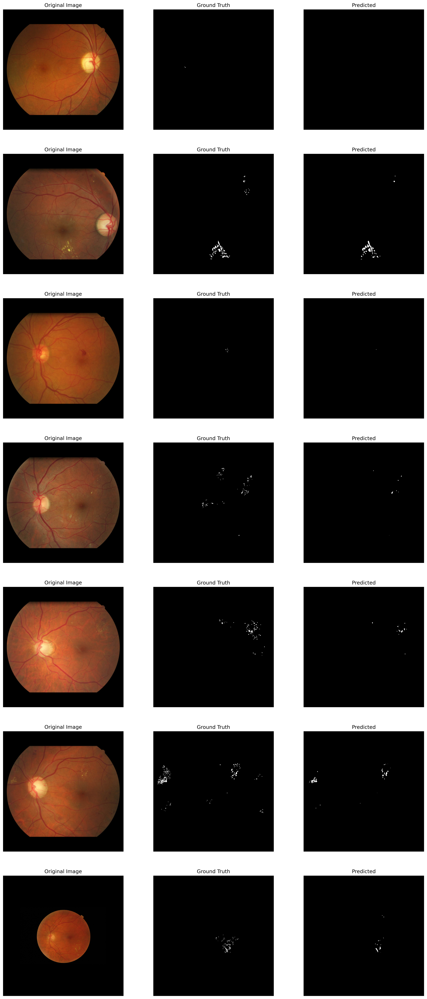

In [8]:

fig, ax = plt.subplots(nrows = 7, ncols = 3, figsize = (18, 7*6), dpi = 300)
imgs, masks = next(iter(test_loader))
for i in tqdm(range(7)):
    dice_coeff_ep = 0
    jaccard_indx =0
    f1_ep = 0
    img = imgs[i]
    mask = masks[i].numpy()
    mask[mask == 1] == 255
    with torch.no_grad():
        output = model(img.unsqueeze(0))
        _, pred_mask = output.max(1)
        pred_mask = pred_mask.squeeze(0).numpy()
        pred_mask[pred_mask == 1] = 255
        # images = imgs[i].to(device)
        # masks = masks[i].to(device).long()
        # outputs = model(images.unsqueeze(0))
        # _, pred = outputs.max(1)

        # dice_coeff_ep = dice(pred.detach(), masks.to(device).unsqueeze(1), average = 'weighted', num_classes = 2)
        # jaccard_indx = ji(pred.detach(), masks.to(device).unsqueeze(1), 2)
        # f1_ep = f1_score(pred.detach(), masks.to(device).unsqueeze(1), average = 'macro', mdmc_average= 'global', num_classes = 2)
        # else:
        #     dice_coeff_ep = dice(pred.detach().float(), masks.to(device).unsqueeze(1))
        #     jaccard_indx = ji(pred.detach().float(), masks.to(device).unsqueeze(1), 2)
        #     f1_ep = f1_score(pred.detach().float(), masks.to(device).unsqueeze(1), average = 'macro', mdmc_average= 'global', num_classes = 2)
    img = img.permute(1,2,0).numpy()
    ax[i,0].imshow(img)
    ax[i,0].set_title('Original Image')
    ax[i,0].axis('off')
    ax[i,1].set_title('Ground Truth')
    ax[i,1].imshow(mask, cmap = 'gray')
    ax[i,1].axis('off')
    ax[i,2].set_title('Predicted')#, dice coeff={dice_coeff_ep}, Jac Index={jaccard_indx}, F1 Score={f1_ep}'.format(dice_coeff_ep=dice_coeff_ep,jaccard_indx=jaccard_indx,f1_ep=f1_ep), fontsize = 10)
    ax[i,2].imshow(pred_mask, cmap = 'gray')
    ax[i,2].axis('off')
plt.savefig('/home/faisal/ESPNetv2/7.1.e_optha_EX/Hard Exudates lr_0.01/ESPnetv2_pred_Hard Exudates.png')
plt.show()

In [9]:
criterion = nn.CrossEntropyLoss()
validate(model, test_loader, epoch=1)

(0.004268559627234936, tensor(0.9987), tensor(0.6763), tensor(0.7611))

In [10]:
criterion = nn.CrossEntropyLoss()
validate(model, val_loader, epoch=1)

(0.022894592955708504, tensor(0.9970), tensor(0.5554), tensor(0.6014))